In [2]:
import pandas as pd
import numpy as np
import pandas as pd
import statistics
import os
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from plotly.offline import init_notebook_mode, iplot, plot
import plotly as py
init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.express as px
import statistics as stat
from scipy.stats import binom
from sklearn.preprocessing import StandardScaler
from matplotlib.patches import Rectangle
# splitting merge_data into train test and split
from sklearn.model_selection import train_test_split, cross_validate
from scipy import stats
from scipy.stats import normaltest
import os 
from sklearn.preprocessing import MinMaxScaler
from sklearn import preprocessing
import matplotlib as mpl
import warnings; warnings.filterwarnings(action='once')
# to keep track of training time
import datetime
# logistic regression model
from sklearn.linear_model import LogisticRegression
# metrics used for evaluation
from sklearn.metrics import f1_score, matthews_corrcoef
# visualizations
from yellowbrick.classifier import ClassPredictionError, ConfusionMatrix
from sklearn.metrics import plot_roc_curve
# KNN imputation
from sklearn.impute import KNNImputer
# normalizer
from sklearn.preprocessing import Normalizer
# variance threshold
from sklearn.feature_selection import VarianceThreshold
# RFECV
from sklearn.model_selection import StratifiedKFold
# random forest
from sklearn.ensemble import RandomForestClassifier
# evaluation metric


In [3]:
df = pd.read_csv("LoanStats.csv")

In [4]:
df.shape

(39786, 7)

## Data Understanding

In [5]:
observed1 = df["term"].value_counts()
observed1

36    29096
60    10690
Name: term, dtype: int64

In [6]:
#plt.scatter(df.loan_amnt,df.int_rate)

In [7]:
import plotly.express as px
fig = px.box(df, x="term", y="int_rate")
fig.show()

c:\ProgramData\Anaconda3\lib\site-packages\plotly\io\_renderers.py:396: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



In [8]:
observed = df["purpose"].value_counts()
observed

debt_consolidation    18676
credit_card            5137
other                  4001
home_improvement       2985
major_purchase         2188
small_business         1831
car                    1551
wedding                 948
medical                 695
moving                  583
house                   382
vacation                381
educational             325
renewable_energy        103
Name: purpose, dtype: int64

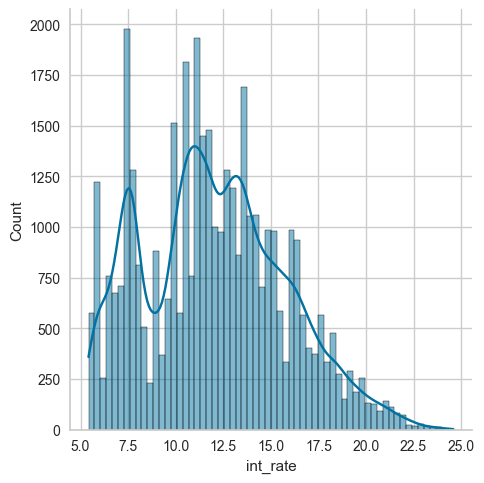

In [9]:
sns.displot(data=df, x="int_rate", kde=True)

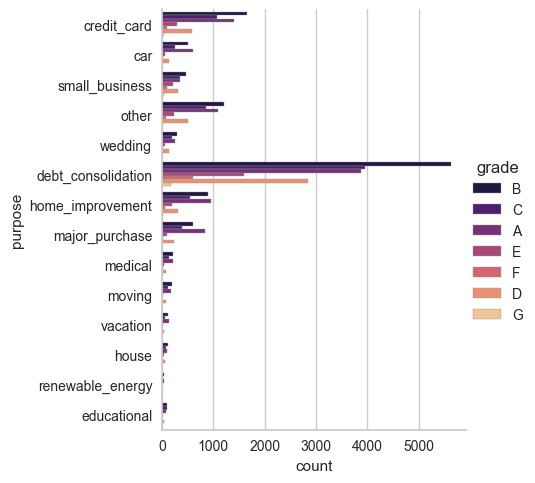

In [10]:

sns.catplot(
    data=df, y="purpose", hue="grade", kind="count",
    palette="magma", edgecolor=".6",
)

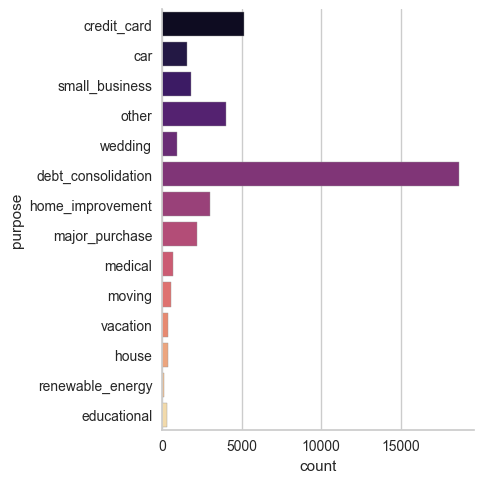

In [11]:
sns.catplot(
    data=df, y="purpose", kind="count",
    palette="magma", edgecolor=".6",
)

In [12]:
df.describe()

,int_rate,loan_amnt,term,annual_inc
count,39786.000000,39786.000000,39786.000000,3.978600e+04
mean,12.027873,11231.360277,42.448499,6.897907e+04
std,3.727466,7464.542832,10.638782,6.376263e+04
min,5.420000,500.000000,36.000000,4.000000e+03
25%,9.250000,5500.000000,36.000000,4.050000e+04
50%,11.860000,10000.000000,36.000000,5.900000e+04
75%,14.590000,15000.000000,60.000000,8.234250e+04
max,24.590000,35000.000000,60.000000,6.000000e+06


In [13]:
import plotly.express as px
fig = px.box(df, x="purpose", y="int_rate")
fig.show()

c:\ProgramData\Anaconda3\lib\site-packages\plotly\io\_renderers.py:396: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



In [14]:
import plotly.express as px
fig = px.box(df, x="grade", y="int_rate")
fig.show()

c:\ProgramData\Anaconda3\lib\site-packages\plotly\io\_renderers.py:396: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



In [15]:
import plotly.express as px

fig = px.box(df, x="purpose", y="int_rate", color="home_ownership")
fig.update_traces(quartilemethod="exclusive") # or "inclusive", or "linear" by default
fig.show()

c:\ProgramData\Anaconda3\lib\site-packages\plotly\io\_renderers.py:396: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



In [16]:
fig = px.box(df, x="purpose", y="int_rate", color="grade")
fig.update_traces(quartilemethod="exclusive") # or "inclusive", or "linear" by default
fig.show()

c:\ProgramData\Anaconda3\lib\site-packages\plotly\io\_renderers.py:396: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



## Data Preparation

In [17]:
#Checking if there is any missing value in the data 
df.isna().any().any()

False

In [18]:
df.columns

Index(['int_rate', 'loan_amnt', 'term', 'grade', 'home_ownership',
       'annual_inc', 'purpose'],
      dtype='object')

In [19]:
df.head()

,int_rate,loan_amnt,term,grade,home_ownership,annual_inc,purpose
0,10.65,5000,36,B,RENT,24000.0,credit_card
1,15.27,2500,60,C,RENT,30000.0,car
2,15.96,2400,36,C,RENT,12252.0,small_business
3,13.49,10000,36,C,RENT,49200.0,other
4,12.69,3000,60,B,RENT,80000.0,other


In [20]:
print(df.dtypes)

int_rate          float64
loan_amnt           int64
term                int64
grade              object
home_ownership     object
annual_inc        float64
purpose            object
dtype: object


In [21]:
df["grade"] = df["grade"].astype("category")
print(df.dtypes)

int_rate           float64
loan_amnt            int64
term                 int64
grade             category
home_ownership      object
annual_inc         float64
purpose             object
dtype: object


In [22]:
# encoding for nominal variables 
df.grade =df.grade.cat.reorder_categories(["A","B","C","D","E","F","G"])

In [23]:
df.grade= df.grade.cat.codes

In [24]:
# one hot encoding for nomial variables 
dummies1= pd.get_dummies(df.home_ownership)

In [25]:
dummies2= pd.get_dummies(df.purpose)

In [26]:
merged =pd.concat([df,dummies1,dummies2],axis="columns")

In [27]:
merged

,int_rate,loan_amnt,term,grade,home_ownership,annual_inc,purpose,MORTGAGE,NONE,OTHER,...,home_improvement,house,major_purchase,medical,moving,other,renewable_energy,small_business,vacation,wedding
0,10.65,5000,36,1,RENT,24000.0,credit_card,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,15.27,2500,60,2,RENT,30000.0,car,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,15.96,2400,36,2,RENT,12252.0,small_business,0,0,0,...,0,0,0,0,0,0,0,1,0,0
3,13.49,10000,36,2,RENT,49200.0,other,0,0,0,...,0,0,0,0,0,1,0,0,0,0
4,12.69,3000,60,1,RENT,80000.0,other,0,0,0,...,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39781,8.07,2500,36,0,MORTGAGE,110000.0,home_improvement,1,0,0,...,1,0,0,0,0,0,0,0,0,0
39782,10.28,8500,36,2,RENT,18000.0,credit_card,0,0,0,...,0,0,0,0,0,0,0,0,0,0
39783,8.07,5000,36,0,MORTGAGE,100000.0,debt_consolidation,1,0,0,...,0,0,0,0,0,0,0,0,0,0
39784,7.43,5000,36,0,MORTGAGE,200000.0,other,1,0,0,...,0,0,0,0,0,1,0,0,0,0


In [30]:
#dropping categorical variables 
df_final= merged.drop(["home_ownership","purpose","moving","other"], axis="columns")

In [31]:
df_final

,int_rate,loan_amnt,term,grade,annual_inc,MORTGAGE,NONE,OTHER,OWN,RENT,...,debt_consolidation,educational,home_improvement,house,major_purchase,medical,renewable_energy,small_business,vacation,wedding
0,10.65,5000,36,1,24000.0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
1,15.27,2500,60,2,30000.0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
2,15.96,2400,36,2,12252.0,0,0,0,0,1,...,0,0,0,0,0,0,0,1,0,0
3,13.49,10000,36,2,49200.0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
4,12.69,3000,60,1,80000.0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39781,8.07,2500,36,0,110000.0,1,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
39782,10.28,8500,36,2,18000.0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
39783,8.07,5000,36,0,100000.0,1,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
39784,7.43,5000,36,0,200000.0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [52]:
x= df_final.drop(["int_rate"], axis="columns")

In [53]:
x

,loan_amnt,term,grade,annual_inc,MORTGAGE,NONE,OTHER,OWN,RENT,car,...,debt_consolidation,educational,home_improvement,house,major_purchase,medical,renewable_energy,small_business,vacation,wedding
0,5000,36,1,24000.0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
1,2500,60,2,30000.0,0,0,0,0,1,1,...,0,0,0,0,0,0,0,0,0,0
2,2400,36,2,12252.0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,1,0,0
3,10000,36,2,49200.0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
4,3000,60,1,80000.0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39781,2500,36,0,110000.0,1,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
39782,8500,36,2,18000.0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
39783,5000,36,0,100000.0,1,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
39784,5000,36,0,200000.0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [54]:

y=df_final["int_rate"]

In [39]:
y

0        10.65
1        15.27
2        15.96
3        13.49
4        12.69
         ...  
39781     8.07
39782    10.28
39783     8.07
39784     7.43
39785    13.75
Name: int_rate, Length: 39786, dtype: float64

## Splitting Data

In [55]:
x_train,x_test,y_train,y_test =train_test_split(x,y,test_size=.2, random_state=42)

In [56]:
from sklearn.linear_model import LinearRegression

In [57]:
len(x_train)

31828

In [58]:
model = LinearRegression().fit(x_train, y_train)
print (model)

LinearRegression()


## Evauate Train Model

In [61]:
predictions = model.predict(x_test)
np.set_printoptions(suppress=True)
print('Predicted labels: ', np.round(predictions)[:10])
print('Actual labels   : ' ,y_test[:10])

Predicted labels:  [ 8. 18. 18. 11. 16.  8.  8. 18. 11.  8.]
Actual labels   :  22900     5.79
27960    17.93
32773    16.45
16463    10.74
22822    14.46
12833     5.42
17036     7.66
29184    16.82
30104    10.99
26804     7.14
Name: int_rate, dtype: float64


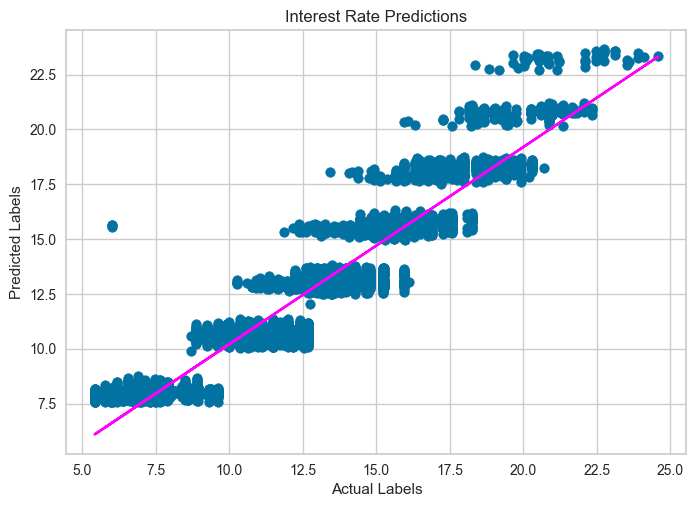

In [63]:
plt.scatter(y_test, predictions)
plt.xlabel('Actual Labels')
plt.ylabel('Predicted Labels')
plt.title('Interest Rate Predictions')
# overlay the regression line
z = np.polyfit(y_test, predictions, 1)
p = np.poly1d(z)
plt.plot(y_test,p(y_test), color='magenta')
plt.show()

In [64]:
model.score(x_test,y_test)

0.9022602911185348

In [65]:
from sklearn.metrics import mean_squared_error, r2_score

mse = mean_squared_error(y_test, predictions)
print("MSE:", mse)

rmse = np.sqrt(mse)
print("RMSE:", rmse)

r2 = r2_score(y_test, predictions)
print("R2:", r2)

MSE: 1.3401608423994482
RMSE: 1.157653161529587
R2: 0.9022602911185348


## Trying different Algorihms

Lasso() 

MSE: 1.959862622985153
RMSE: 1.3999509359206674
R2: 0.8570646177997056


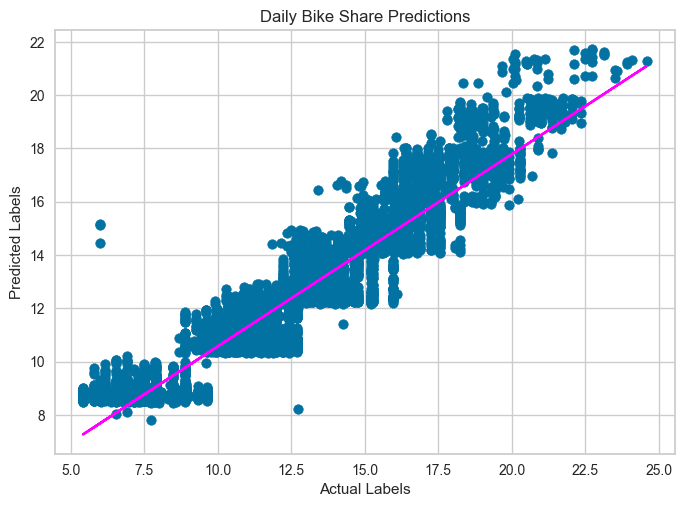

In [66]:
from sklearn.linear_model import Lasso

# Fit a lasso model on the training set
model = Lasso().fit(x_train, y_train)
print (model, "\n")

# Evaluate the model using the test data
predictions = model.predict(x_test)
mse = mean_squared_error(y_test, predictions)
print("MSE:", mse)
rmse = np.sqrt(mse)
print("RMSE:", rmse)
r2 = r2_score(y_test, predictions)
print("R2:", r2)

# Plot predicted vs actual
plt.scatter(y_test, predictions)
plt.xlabel('Actual Labels')
plt.ylabel('Predicted Labels')
plt.title('Daily Bike Share Predictions')
# overlay the regression line
z = np.polyfit(y_test, predictions, 1)
p = np.poly1d(z)
plt.plot(y_test,p(y_test), color='magenta')
plt.show()

In [68]:
# Decision tree
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import export_text

# Train the model
model = DecisionTreeRegressor().fit(x_train, y_train)
print (model, "\n")

# Visualize the model tree
tree = export_text(model)
print(tree)

DecisionTreeRegressor() 

|--- feature_2 <= 1.50
|   |--- feature_2 <= 0.50
|   |   |--- feature_12 <= 0.50
|   |   |   |--- feature_8 <= 0.50
|   |   |   |   |--- feature_0 <= 12837.50
|   |   |   |   |   |--- feature_1 <= 48.00
|   |   |   |   |   |   |--- feature_9 <= 0.50
|   |   |   |   |   |   |   |--- feature_15 <= 0.50
|   |   |   |   |   |   |   |   |--- feature_6 <= 0.50
|   |   |   |   |   |   |   |   |   |--- feature_0 <= 4637.50
|   |   |   |   |   |   |   |   |   |   |--- feature_0 <= 3262.50
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 31
|   |   |   |   |   |   |   |   |   |   |--- feature_0 >  3262.50
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 23
|   |   |   |   |   |   |   |   |   |--- feature_0 >  4637.50
|   |   |   |   |   |   |   |   |   |   |--- feature_3 <= 52790.00
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 26
|   |   |   |   |   |   |   |   |   |   |--- feature_3 >  5

MSE: 1.9978914506734335
RMSE: 1.4134678810193861
R2: 0.8542911249249987


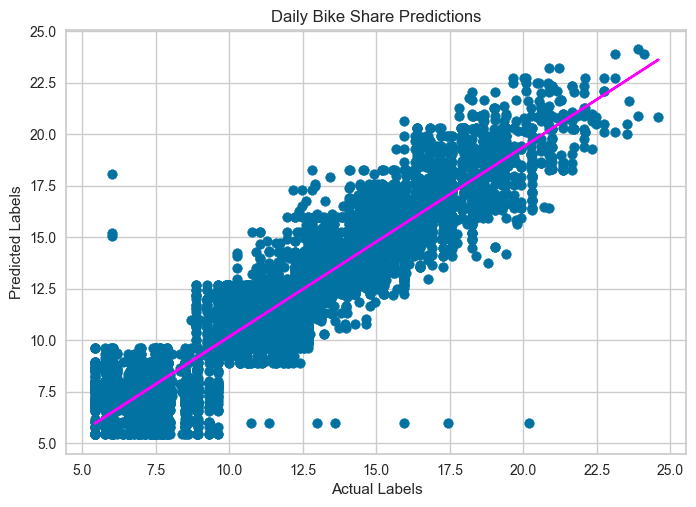

In [69]:
# Evaluate the model using the test data
predictions = model.predict(x_test)
mse = mean_squared_error(y_test, predictions)
print("MSE:", mse)
rmse = np.sqrt(mse)
print("RMSE:", rmse)
r2 = r2_score(y_test, predictions)
print("R2:", r2)

# Plot predicted vs actual
plt.scatter(y_test, predictions)
plt.xlabel('Actual Labels')
plt.ylabel('Predicted Labels')
plt.title('Daily Bike Share Predictions')
# overlay the regression line
z = np.polyfit(y_test, predictions, 1)
p = np.poly1d(z)
plt.plot(y_test,p(y_test), color='magenta')
plt.show()

RandomForestRegressor() 

MSE: 1.1918228875699088
RMSE: 1.0917064108861452
R2: 0.913078775036594


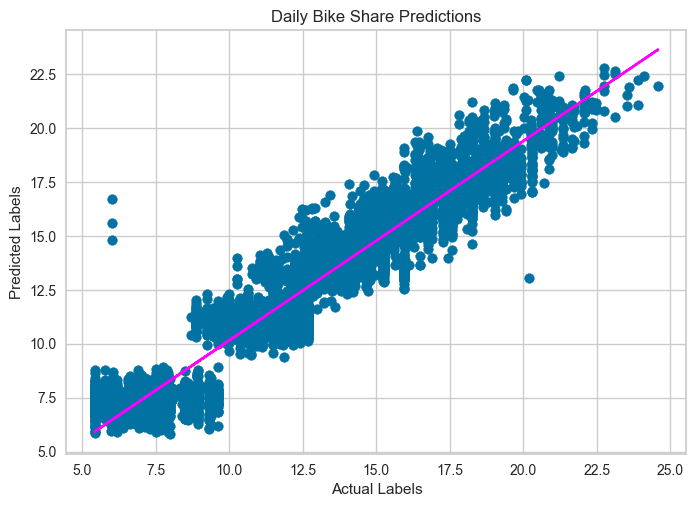

In [70]:
from sklearn.ensemble import RandomForestRegressor

# Train the model
model = RandomForestRegressor().fit(x_train, y_train)
print (model, "\n")

# Evaluate the model using the test data
predictions = model.predict(x_test)
mse = mean_squared_error(y_test, predictions)
print("MSE:", mse)
rmse = np.sqrt(mse)
print("RMSE:", rmse)
r2 = r2_score(y_test, predictions)
print("R2:", r2)

# Plot predicted vs actual
plt.scatter(y_test, predictions)
plt.xlabel('Actual Labels')
plt.ylabel('Predicted Labels')
plt.title('Daily Bike Share Predictions')
# overlay the regression line
z = np.polyfit(y_test, predictions, 1)
p = np.poly1d(z)
plt.plot(y_test,p(y_test), color='magenta')
plt.show()

GradientBoostingRegressor() 

MSE: 1.008475885071583
RMSE: 1.0042290003139638
R2: 0.9264505152647228


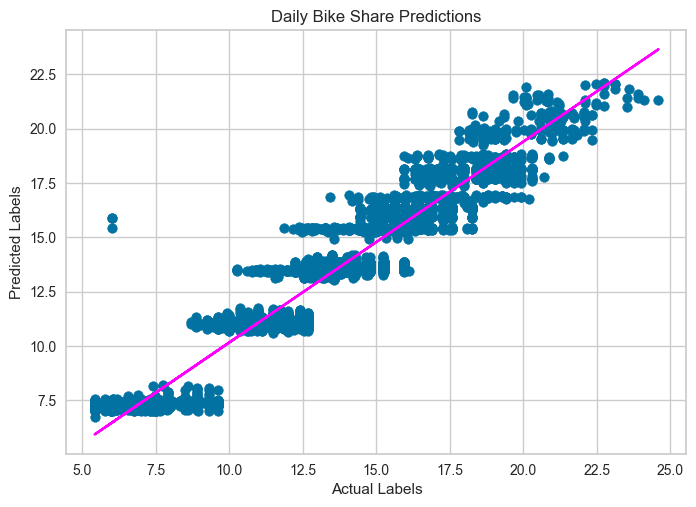

In [71]:
# Train the model
from sklearn.ensemble import GradientBoostingRegressor

# Fit a lasso model on the training set
model = GradientBoostingRegressor().fit(x_train, y_train)
print (model, "\n")

# Evaluate the model using the test data
predictions = model.predict(x_test)
mse = mean_squared_error(y_test, predictions)
print("MSE:", mse)
rmse = np.sqrt(mse)
print("RMSE:", rmse)
r2 = r2_score(y_test, predictions)
print("R2:", r2)

# Plot predicted vs actual
plt.scatter(y_test, predictions)
plt.xlabel('Actual Labels')
plt.ylabel('Predicted Labels')
plt.title('Daily Bike Share Predictions')
# overlay the regression line
z = np.polyfit(y_test, predictions, 1)
p = np.poly1d(z)
plt.plot(y_test,p(y_test), color='magenta')
plt.show()